In [ ]:
from tensorflow.keras.models import *
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import *

In [ ]:
import tensorflow as tf
import pandas as pd

print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


Num GPUs Available:  1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


a. The dog breed identification dataset is 715.16MB (Taken from kagle).
   The dataset contain 2 files(labels, 
sample_submission) and 2 folders (test - 10,406 photos ,train -10,292 photos)

files in data set ['labels.csv', 'sample_submission.csv']
number of files in the dataset:  2
number of folders in the dataset:  2
folder name : test
number of files in  test : 10406
folder name : train
number of files in  train : 10292

In [ ]:
path_to_folder = '/content/drive/My Drive/DLWorkshop/ass1/'

In [15]:
import os, os.path
path, dirs, files = next(os.walk(path_to_folder))

print ("files in data set" ,files)
print ("number of files in the dataset: " ,len(files))

print ("number of folders in the dataset: ", len(dirs))
for d in dirs:
  print("folder name :" ,d)
  path, dirs, files = next(os.walk(path_to_folder+d))
  print ("number of files in ", d ,":" ,len(files))

files in data set ['labels.csv', 'sample_submission.csv', 'best_model_weights_transfer.h5', 'best_model_weights_try.h5']
number of files in the dataset:  4
number of folders in the dataset:  3
folder name : train
number of files in  train : 10222
folder name : test
number of files in  test : 10370
folder name : logs
number of files in  logs : 0


In [ ]:
import keras.preprocessing as kPreprocess

print("dimensions of the first photo:", str(kPreprocess.image.img_to_array(kPreprocess.image.load_img(path_to_folder+'train'+'/008ba178d6dfc1a583617470d19c1673.jpg')).shape))
print("dimensions of the random photo:", str(kPreprocess.image.img_to_array(kPreprocess.image.load_img(path_to_folder+'train'+'/009509be3ca7cce0ff9e37c8b09b1125.jpg')).shape))
labels_file = pd.read_csv(path_to_folder+'labels.csv')


dimensions of the first photo: (320, 390, 3)
dimensions of the random photo: (346, 400, 3)


b. 
Each sample containnd a photo in size of 320*390 with 3 color channels.
The dataset contain 120 labels that present the breed of the dogs. 
The photos are alomost ready to use , to get more accurate results we can use augmentation techniqe in order to expand the dataset by duplicating photos from different angles, for example :Brightness Augmentation ,Rotation Augmentation,Zoom Augmentation and Flip Augmentation. 
We may reshape all the photos to the same size even if our accurate will be infloance to the worst so our model will train easly.


In [ ]:
labels_file.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


let's take a look one the first element for example

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
classes = labels_file.groupby(['breed'])['breed'].count().sort_values(ascending=True)
print("number of Dog breed classes: ", len(classes))
print(classes)

number of Dog breed classes:  120
breed
briard                             66
eskimo_dog                         66
komondor                           67
brabancon_griffon                  67
golden_retriever                   67
german_shepherd                    69
walker_hound                       69
giant_schnauzer                    69
tibetan_mastiff                    69
otterhound                         69
vizsla                             70
french_bulldog                     70
soft-coated_wheaten_terrier        71
chihuahua                          71
kuvasz                             71
standard_schnauzer                 72
border_collie                      72
flat-coated_retriever              72
curly-coated_retriever             72
redbone                            72
malinois                           73
brittany_spaniel                   73
cocker_spaniel                     74
doberman                           74
american_staffordshire_terrier     74
english_sp

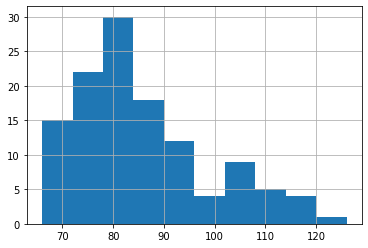

In [ ]:
labels_file.breed.value_counts().hist()


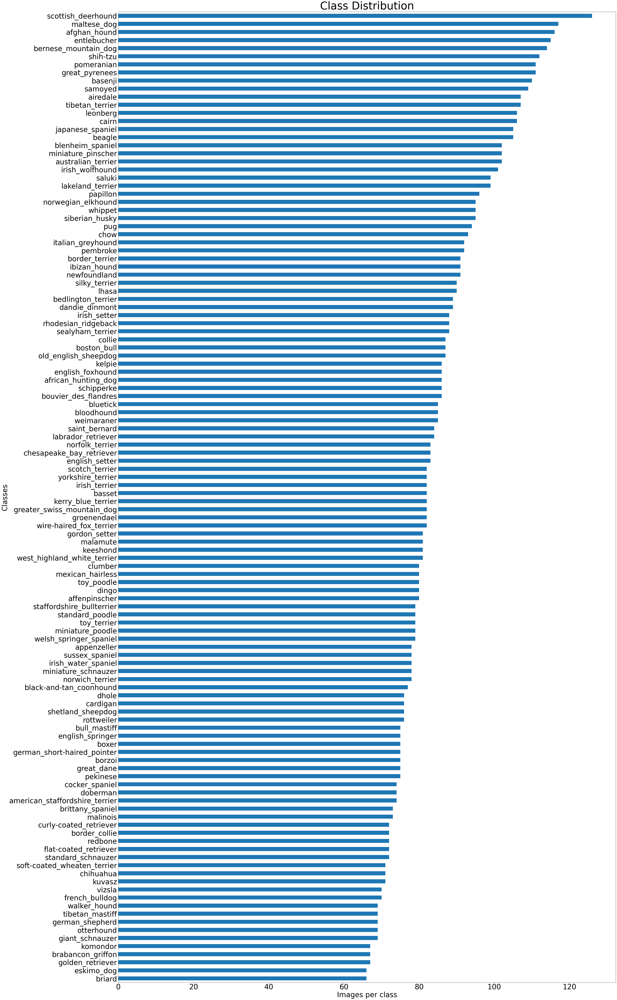

In [ ]:
import matplotlib.pyplot as plt

ax=pd.value_counts(labels_file['breed'],ascending=True).plot(kind='barh',fontsize="40",title="Class Distribution",figsize=(50,100))
ax.set(xlabel="Images per class", ylabel="Classes")
ax.xaxis.label.set_size(40)
ax.yaxis.label.set_size(40)
ax.title.set_size(60)
plt.show()

c.
As we can see , the dataset is imbalanced.
we have some breed with more train photos then others. (the difference between the max breed to the min breed is 80 photos.

d. We found some benchmark from other kaggle notebooks:

1. Some of the users used both InceptionV3 and Xception for predicting, then ensembled the features from the two network using average and extracted new features.
2. Some of the users used VGG16 and tuned it by generating bottleneck features.


making a path for each id


In [ ]:
data = labels_file

In [ ]:
import cv2
def read_and_resize_single_img(filename,nrow=224,ncol=224,channels=3):
    from scipy import misc
    arr = cv2.imread(filename)
    arr = cv2.cvtColor(arr, cv2.COLOR_RGB2BGR)
    arr = cv2.resize(arr,dsize=(nrow,ncol))
    return arr

In [ ]:
def id_to_path(id):
  return path_to_folder+"train/"+ id+".jpg"
data['path']=data['id'].apply(id_to_path)

In [ ]:
list(data['path'])

In [ ]:
import numpy as np
import IPython

def load_images(paths):
  out = display(IPython.display.Pretty('Starting'), display_id=True)
  counter =0
  imgs = []
  size = len(paths)
  for path in paths:
    counter+=1
    imgs.append(read_and_resize_single_img(path))
    out.update(IPython.display.Pretty(str(counter)+'/'+str(size)))

  out.update(IPython.display.Pretty('Done.'))
  return np.array(imgs)
images = load_images(data['path'])
images.shape

5325/10222

E. 
similar breed categories are :german_shepherd & malinois therefore it will be hard to seprate them. 
easily breed categories are : golden_retriever & pug  therefor it will be easy to sperate them 


german_shaperd vs malinoa


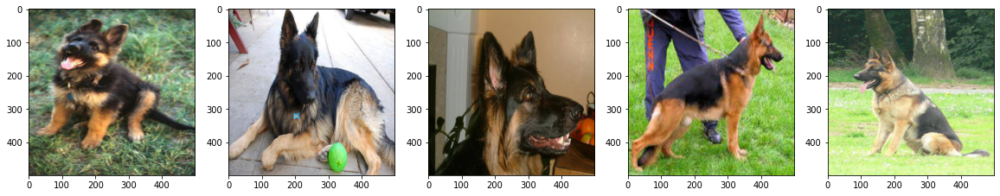

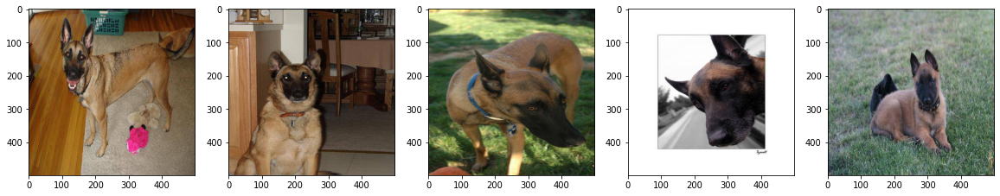

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import axis, figure
import matplotlib.image as mpimg
import cv2
import pandas as pd 

labels_file = pd.read_csv(path_to_folder+'labels.csv')
def show_photos_process(images):
    fig = figure(figsize=(20, 20))
    i=0
    for image in images:
      im = mpimg.imread(path_to_folder+ 'train/' + image+'.jpg')
      fig.add_subplot(1,len(images),i+1)
      i=i+1
      plt.imshow(cv2.resize(im,(500,500)))


german_shaperd_photo = labels_file[labels_file['breed'].isin(['german_shepherd'])]['id'][:5]
malinoa_photos = labels_file[labels_file['breed'].isin(['malinois'])]['id'][:5] 
golden_retriver_photos = labels_file[labels_file['breed'].isin(['golden_retriever'])]['id'][:5] 
pug_photos = labels_file[labels_file['breed'].isin(['pug'])]['id'][:5] 

print ('german_shaperd vs malinoa' )
show_photos_process(german_shaperd_photo)
show_photos_process(malinoa_photos)

golden_retriver vs pug


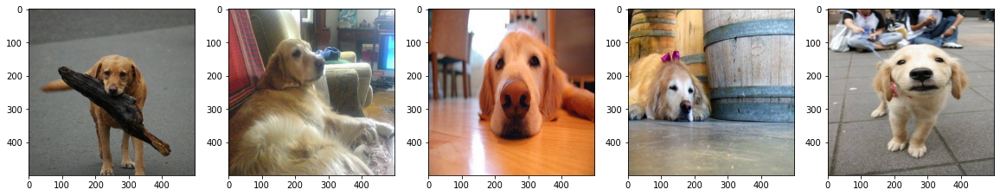

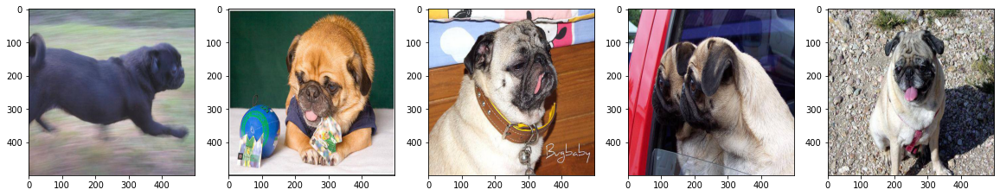

In [ ]:
print ('golden_retriver vs pug' )
show_photos_process(golden_retriver_photos)
show_photos_process(pug_photos)

## 2. Forming neural network graph

### building model

In [ ]:
from keras import models
from keras import layers
def get_base_model(n_classes, last_n=600):
    inp = Input(shape=(224, 224, 3))
    model = models.Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Dropout(0.5))

    model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Dropout(0.5))

    model.add(Conv2D(16, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Conv2D(16, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Dropout(0.5))

    model.add(Conv2D(8, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Conv2D(8, (3, 3), input_shape=(224, 224, 3), activation='relu'))
    model.add(Dropout(0.5))

    model.add(layers.MaxPooling2D())
    model.add(Flatten())
    model.add(layers.Dense(n_classes, activation='softmax'))



    return model


# model = get_base_model(120, 600)
# model.summary()

In [ ]:
def get_base_model(n_classes,last_n = 600):
    inp = Input(shape=(224,224,3))
    x = Conv2D(32,(3,3),activation='relu')(inp)
    x = Conv2D(32,(3,3),activation='relu')(x)
    x = Dropout(0.3)(x)
    x = MaxPool2D()(x)
    x = Conv2D(16,(3,3),activation='relu')(x)
    x = Conv2D(16,(3,3),activation='relu')(x)
    x = Dropout(0.33)(x)
    x = MaxPool2D()(x)
    x = Flatten()(x)
    x = Dense(last_n,activation='relu')(x)
    x = Dense(n_classes,activation='softmax')(x)
    return Model(inputs = inp,outputs = x)
#model = get_base_model(120)
#model.compile(loss='categorical_crossentropy',optimizer='adam')

In [ ]:
model = get_base_model(120,600)
# K_fold_fit(images[:1000],pd.get_dummies(data['breed']).to_numpy()[:1000])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 222, 222, 64)      1792      
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 220, 220, 64)      36928     
_________________________________________________________________
dropout_8 (Dropout)          (None, 220, 220, 64)      0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 218, 218, 32)      18464     
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 216, 216, 32)      9248      
_________________________________________________________________
dropout_9 (Dropout)          (None, 216, 216, 32)      0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 214, 214, 16)     

In [ ]:
path_to_folder+'best_model_weights_{}.h5'.format('run1')

'/content/drive/My Drive/DLWorkshop/ass1/best_model_weights_run1.h5'

### callbacks

In [ ]:
from keras.callbacks import ReduceLROnPlateau, TensorBoard, ModelCheckpoint
def set_callbacks(description='run1', es_patience=10, rlop_patience=7, tb_base_logdir=path_to_folder + '/logs/'):
    cp = ModelCheckpoint(path_to_folder+'best_model_weights_{}.h5'.format('try'))
    # es = EarlyStopping(patience=es_patience, monitor='val_accuracy')
    rlop = ReduceLROnPlateau(patience=rlop_patience)
    tb = TensorBoard(log_dir='{}{}'.format(tb_base_logdir, description))
    # return [es, rlop, tb, cp]
    return [rlop, tb, cp]

## 2.b 5 fold fitting

In [ ]:
from sklearn.model_selection import KFold
def K_fold_fit(X,Y,n_fold=5,shuffle=False,n_last=600,run=1):
  counter = 1
  history = []
  for train_index,test_index in KFold(n_fold,shuffle=shuffle).split(X):
    # print(train_index)
    x_train,x_test=X[train_index],X[test_index]
    y_train,y_test=Y[train_index],Y[test_index]
    print("train fold "+str(counter))
    model = get_base_model(120,n_last)
    model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
    history.append(model.fit(x_train, pd.get_dummies(y_train),validation_data=(x_test,pd.get_dummies(y_test)), epochs=10,callbacks=set_callbacks(description='run4'+str(run)+'/fold'+str(counter))))
    counter+=1
  return history 
res = K_fold_fit(images[:100],data['breed'][:100])


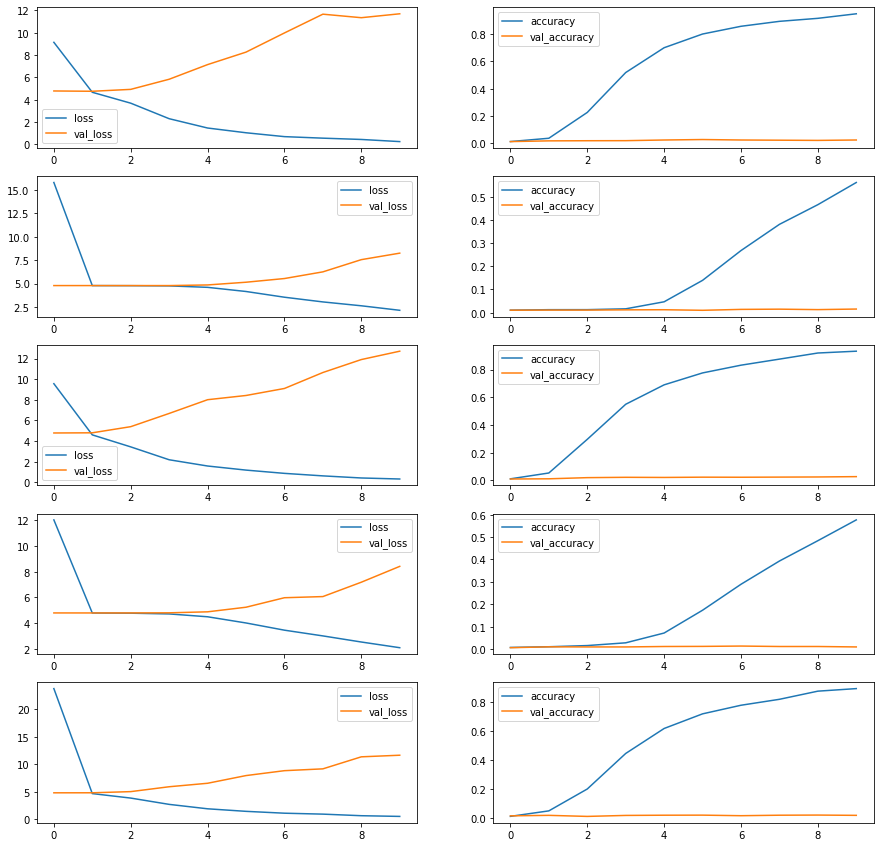

In [ ]:
# print(res[0].history)
%matplotlib inline
import matplotlib.pyplot as plt
fig, axs = plt.subplots(5, 2,figsize=(15,15))
counter = 0
for history in res:
  axs[counter,0].plot(history.history['loss'])
  axs[counter,0].plot(history.history['val_loss'])
  axs[counter,0].legend(['loss','val_loss'])
  axs[counter,1].plot(history.history['accuracy'])
  axs[counter,1].plot(history.history['val_accuracy'])
  axs[counter,1].legend(['accuracy','val_accuracy'])
  counter += 1

### 2.d

as we can see we have overfitting, maybe we can impore by:

1. maybe we get the same dog breeg in each fold so we need to shuffle things a little bit
2. augmentation
3. less weights on the last layer

shuffle

In [ ]:
res = K_fold_fit(images,data['breed'],5,shuffle=True,run=2)
fig, axs = plt.subplots(5, 2,figsize=(15,15))
counter = 0
for history in res:
  axs[counter,0].plot(history.history['loss'])
  axs[counter,0].plot(history.history['val_loss'])
  axs[counter,0].legend(['loss','val_loss'])
  axs[counter,1].plot(history.history['accuracy'])
  axs[counter,1].plot(history.history['val_accuracy'])
  axs[counter,1].legend(['accuracy','val_accuracy'])
  counter += 1

train fold 1
Epoch 1/10
  1/256 [..............................] - ETA: 0s - loss: 61.3007 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
256/256 [==============================] - 13s 53ms/step - loss: 7.6704 - accuracy: 0.0108 - val_loss: 4.7822 - val_accuracy: 0.0103
Epoch 2/10
256/256 [==============================] - 13s 49ms/step - loss: 4.5842 - accuracy: 0.0581 - val_loss: 4.7775 - val_accuracy: 0.0171
Epoch 3/10
256/256 [==============================] - 13s 50ms/step - loss: 3.4486 - accuracy: 0.2865 - val_loss: 5.3426 - val_accuracy: 0.0215
Epoch 4/10
256/256 [==============================] - 13s 49ms/step - loss: 2.2262 - accuracy: 0.5410 - val_loss: 6.6015 - val_accuracy: 0.0171
Epoch 5/10
256/256 [========================

NameError: ignored

### shuffle + augmentation

In [ ]:
from sklearn.model_selection import KFold
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False)

# model.fit_generator(datagen.flow(np.expand_dims(X_train[:33600],axis=-1),to_categorical(y_train[:33600]), batch_size=32),
#                     validation_data=datagen.flow(np.expand_dims(X_train[33600:],axis=-1),to_categorical(y_train[33600:])),
#                     steps_per_epoch=len(X_train)//8,validation_steps = 2500, epochs=3)
def K_fold_fit(X,n_fold=5,shuffle=False,n_last=600,run=1):
  counter = 1
  history = []
  for train_index,test_index in KFold(n_fold,shuffle=shuffle).split(X):
    # print(train_index)
    train,test=X.iloc[train_index],X.iloc[test_index]
    # y_train,y_test=Y[train_index],Y[test_index]
    print("train fold "+str(counter))
    model = get_base_model(120,n_last)
    model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
    history.append(model.fit( datagen.flow_from_dataframe (train,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)),
                                       validation_data=datagen.flow_from_dataframe(test,x_col="path", y_col="breed",target_size=(224, 224)), epochs=10
                                       ,callbacks=set_callbacks(description='r'+str(run)+'fold'+str(counter))))
    counter+=1
  return history 
res = K_fold_fit(data,shuffle=True,run=15)

In [ ]:
res = K_fold_fit(images,data['breed'],n_last=128)
fig, axs = plt.subplots(5, 2,figsize=(15,15))
counter = 0
for history in res:
  axs[counter,0].plot(history.history['loss'])
  axs[counter,0].plot(history.history['val_loss'])
  axs[counter,0].legend(['loss','val_loss'])
  axs[counter,1].plot(history.history['accuracy'])
  axs[counter,1].plot(history.history['val_accuracy'])
  axs[counter,1].legend(['accuracy','val_accuracy'])
  counter += 1

In [ ]:
# pd.value_counts(1,ascending=True)
data['breed'].iloc[[2,3]]

In [ ]:
data

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


### 2.e

In [ ]:
from tqdm import tqdm
model = get_base_model(120)
# load checkpoint
tta_steps = 10
predictions = []

from sklearn.linear_model import LogisticRegression
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False)

train,val= train_test_split(data, test_size=0.1, random_state=42)
model = get_base_model(120)
model.load_weights('/content/drive/MyDrive/DLWorkshop/ass1/best_model_weights_try.h5')

# model.layers.pop()
# train_by_keras_features = model.predict(datagen.flow_from_dataframe (val,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)))

bs = 32
for i in tqdm(range(tta_steps)):
    preds = model.predict_generator(train_datagen.flow_from_dataframe(val,x_col="path",y_col='breed', batch_size=bs, shuffle=False,target_size=(224, 224)), steps = len(val)/bs)
    predictions.append(preds)

pred = np.mean(predictions, axis=0)
res = pd.get_dummies(val['breed']).idxmax(axis=1 ).apply(lambda col_name : pd.get_dummies(val['breed']).columns.get_loc(col_name) )
np.mean(np.equal(res, np.argmax(pred, axis=-1)))

array([[0.00820784, 0.00990557, 0.00984396, ..., 0.00841435, 0.01052378,
        0.00711833],
       [0.00226872, 0.00943839, 0.00511252, ..., 0.01070459, 0.00645311,
        0.00938076],
       [0.00425439, 0.01022349, 0.00394158, ..., 0.01173574, 0.01331186,
        0.01046937],
       ...,
       [0.00955276, 0.0088588 , 0.01429489, ..., 0.00965095, 0.0095312 ,
        0.00759322],
       [0.00734027, 0.01106078, 0.00800298, ..., 0.00921071, 0.00765393,
        0.01521907],
       [0.01289783, 0.01048492, 0.01361797, ..., 0.00640414, 0.00708145,
        0.00801519]], dtype=float32)

In [ ]:
np.mean(np.equal(res, np.argmax(pred, axis=-1)))


0.028347996089931573

In [ ]:
np.argmax(pred, axis=-1)

array([ 9, 79, 94, ..., 97, 87, 42])

In [ ]:
pred.shape

(1023, 120)

In [ ]:
res = pd.get_dummies(val['breed']).idxmax(axis=1 ).apply(lambda col_name : pd.get_dummies(val['breed']).columns.get_loc(col_name) )

## 3 Select a trained model architecture

In [ ]:
from tensorflow.keras.applications import VGG16
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False)

def get_model_all_classes(n_classes):
    vgg16 = VGG16(weights='imagenet', include_top=True)
    # vgg16.summary()
    for l in vgg16.layers:
        l.trainable = False

    x = GlobalAveragePooling2D()(vgg16.layers[-5].output)
    x = Dropout(0.3)(x)
#     x = Flatten()(x)
    x = Dense(n_classes,activation='softmax',name = 'predictions')(x)
    model = Model(inputs = vgg16.input,outputs = x)
    # model.summary()
    return model

X,Y = images,data['breed']
counter = 1
history = []
for train_index,test_index in KFold(5).split(data):
  # print(train_index)
  train,test=data.iloc[train_index],data.iloc[test_index]
  # x_train,x_test=X[train_index],X[test_index]
  # y_train,y_test=Y[train_index],Y[test_index]
  print("train fold "+str(counter))
  if counter >= 4:
    model = get_model_all_classes(120)
    model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
    history.append(model.fit( datagen.flow_from_dataframe (train,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)),
                                        validation_data=datagen.flow_from_dataframe(test,x_col="path", y_col="breed",target_size=(224, 224)), epochs=30
                                        ,callbacks=set_callbacks(description='transfer'+'3c'+'/fold'+str(counter))))
    # history.append(model.fit(x_train, pd.get_dummies(y_train),validation_data=(x_test,pd.get_dummies(y_test)), epochs=30,,callbacks=set_callbacks(description='transfer'+'3c'+'/fold'+str(counter))))
  counter+=1

train fold 1
train fold 2
train fold 3
train fold 4
553467904/553467096 [==============================] - 4s 0us/step
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - 153s 597ms/step - loss: 14.4164 - accuracy: 0.0462 - val_loss: 6.3092 - val_accuracy: 0.1605
Epoch 2/30
256/256 [==============================] - 147s 575ms/step - loss: 8.2045 - accuracy: 0.1667 - val_loss: 4.7152 - val_accuracy: 0.2808
Epoch 3/30
256/256 [==============================] - 147s 573ms/step - loss: 6.0369 - accuracy: 0.2595 - val_loss: 4.0133 - val_accuracy: 0.3488
Epoch 4/30
256/256 [==============================] - 146s 572ms/step - loss: 4.8314 - accuracy: 0.3300 - val_loss: 3.9395 - val_accuracy: 0.3684
Epoch 5/30
256/256 [==============================] - 146s 570ms/step - loss: 4.1000 - accuracy: 0.3871 - val_loss: 3.5774 - val_accuracy: 0.3943
Epoch 6/30
256/256 [====

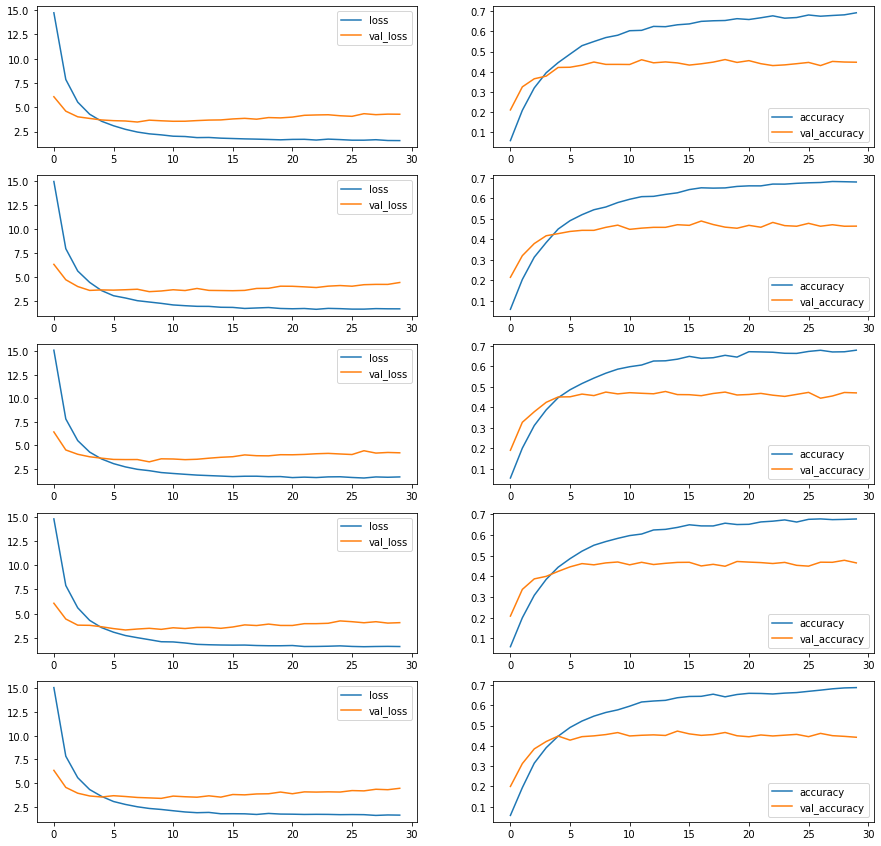

In [ ]:
import matplotlib.pyplot as plt

res = history
fig, axs = plt.subplots(5, 2,figsize=(15,15))
counter = 0
for history in res:
  axs[counter,0].plot(history.history['loss'])
  axs[counter,0].plot(history.history['val_loss'])
  axs[counter,0].legend(['loss','val_loss'])
  axs[counter,1].plot(history.history['accuracy'])
  axs[counter,1].plot(history.history['val_accuracy'])
  axs[counter,1].legend(['accuracy','val_accuracy'])
  counter += 1

## 3d - e 

In [ ]:
from sklearn.linear_model import LogisticRegression
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False)

train,val= train_test_split(data, test_size=0.1, random_state=42)
model = get_model_all_classes(120)
model.load_weights('/content/drive/MyDrive/DLWorkshop/ass1/best_model_weights_transfer.h5')

model.layers.pop()
train_by_keras_features = model.predict(datagen.flow_from_dataframe (train,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)))
Dogs = LogisticRegression(solver='lbfgs',multi_class='auto')
Dogs.fit(train_by_keras_features,train['breed'])
test_by_keras_features = model.predict(datagen.flow_from_dataframe (val,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)))

Dogs.score(test_by_keras_features, val['breed'])

Found 9199 validated image filenames belonging to 120 classes.
Found 1023 validated image filenames belonging to 120 classes.


0.009775171065493646

In [ ]:
test_by_keras_features = model.predict(datagen.flow_from_dataframe (val,x_col="path", y_col="breed",batch_size=32,target_size=(224, 224)))

Dogs.predict(test_by_keras_features)


Found 100 validated image filenames belonging to 69 classes.


521                 cairn
737        scotch_terrier
740                basset
660              bluetick
411              airedale
              ...        
436         irish_terrier
764                collie
88            entlebucher
63     australian_terrier
826            great_dane
Name: breed, Length: 100, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split
train,val= train_test_split(data, test_size=0.1, random_state=42)


In [ ]:
data[:1000]

,id,breed,path
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,/content/drive/My Drive/DLWorkshop/ass1/train/...
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,/content/drive/My Drive/DLWorkshop/ass1/train/...
2,001cdf01b096e06d78e9e5112d419397,pekinese,/content/drive/My Drive/DLWorkshop/ass1/train/...
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick,/content/drive/My Drive/DLWorkshop/ass1/train/...
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever,/content/drive/My Drive/DLWorkshop/ass1/train/...
...,...,...,...
995,187eaac78834950c66b5737394cc0f13,kerry_blue_terrier,/content/drive/My Drive/DLWorkshop/ass1/train/...
996,1880c57a7ac87a232158207581c989df,pekinese,/content/drive/My Drive/DLWorkshop/ass1/train/...
997,189cc11eaaa9152fffb49e4fa5b14ebd,schipperke,/content/drive/My Drive/DLWorkshop/ass1/train/...
998,18a44f4dc15b555f67e0e9f1b7aa0613,tibetan_mastiff,/content/drive/My Drive/DLWorkshop/ass1/train/...


In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%reload_ext tensorboard

In [ ]:
!kill 1405

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DLWorkshop/ass1/logs


<IPython.core.display.Javascript object>

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/DLWorkshop/ass1/logs

2020-11-23 09:28:01.547601: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

/content/drive/MyDrive/DLWorkshop/ass1/logs

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=u